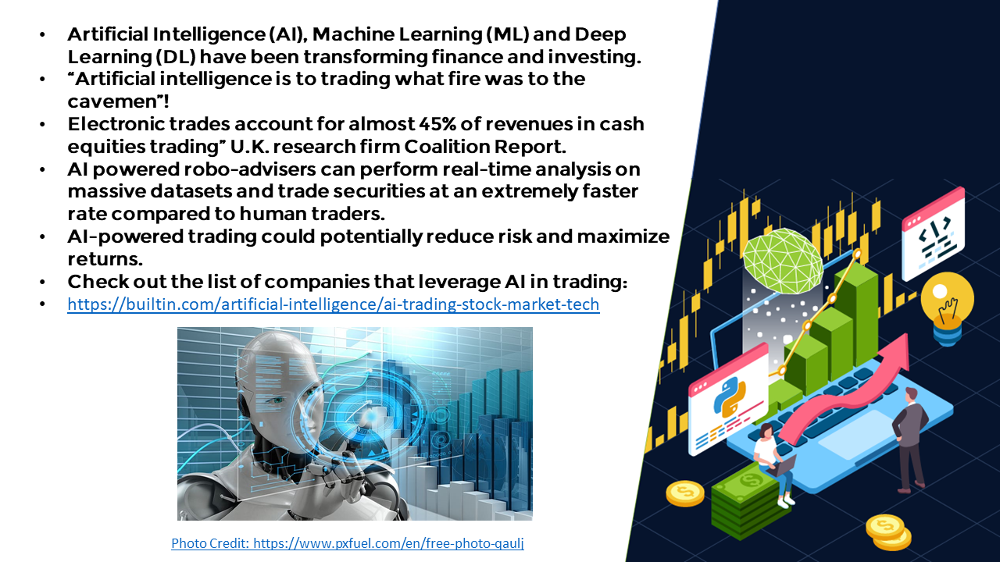

In [13]:

from IPython.display import Image
Image('/home/adish/Downloads/sp1.PNG')

In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow import keras

In [2]:
df_stock=pd.read_csv('/home/adish/Desktop/stock prediction/stock.csv')
df_stock

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [4]:
df_stock_vol=pd.read_csv('/home/adish/Desktop/stock prediction/stock_volume.csv')
df_stock_vol
#shows the volume of shares traded on a specific day

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [6]:
#sort thr data based on date
df_stock_price=df_stock.sort_values(by=['Date'])
df_stock_price

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [8]:
#sort the volume data based on Date
df_stock_volume=df_stock_vol.sort_values(by=['Date'])
df_stock_volume

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [9]:
#checking for null values
df_stock_price.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [10]:
#checking for null values
df_stock_volume.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [11]:
#fetching stockprices dataframe info
df_stock_price.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [12]:
#fetching stockprices dataframe info
df_stock_volume.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2159 non-null   object
 1   AAPL    2159 non-null   int64 
 2   BA      2159 non-null   int64 
 3   T       2159 non-null   int64 
 4   MGM     2159 non-null   int64 
 5   AMZN    2159 non-null   int64 
 6   IBM     2159 non-null   int64 
 7   TSLA    2159 non-null   int64 
 8   GOOG    2159 non-null   int64 
 9   sp500   2159 non-null   int64 
dtypes: int64(9), object(1)
memory usage: 185.5+ KB


In [14]:
#What is the average trading volume for Apple stock?
df_stock_price.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000
mean,140.819823,189.942700,35.162899,23.105743,915.665665,161.853001,259.600815,783.712512,2218.749554
std,70.827601,103.678586,3.207490,6.963847,697.838905,25.561938,210.988003,334.448057,537.321727
min,55.790001,67.239998,26.770000,7.140000,175.929993,94.769997,22.790001,278.481171,1278.040039
25%,89.165714,124.015000,33.040001,18.545000,316.490005,142.769997,184.595001,527.214416,1847.984985
50%,116.599998,142.419998,34.930000,23.780001,676.010010,156.949997,231.960007,737.599976,2106.629883
75%,175.019997,297.044998,37.419998,28.430000,1593.645019,185.974998,307.350006,1079.744995,2705.810059
max,455.609985,440.619995,43.470001,38.029999,3225.000000,215.800003,1643.000000,1568.489990,3386.149902


In [16]:
#What is the average trading volume for Apple stock?
df_stock_volume.describe()
#5.82 * 10^7

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


In [17]:
#What is the maximum trading volume for sp500?
#9.044 *10 ^9

In [18]:
#Which security is traded the most? comment on your answer
#looking At mean,you can see sp500 is traded the most

In [19]:
#What is the average stock price of the S&P500 over the specified time period?
#2218.749554

In [20]:
#What is the maximum price of Tesla Stock?
#1643.000000

## Exploratory data analysis and visualization

In [21]:
#this function normalises stock prices based on their initial price
def normalise(df):
    x=df.copy()
    for i in x.columns[1:]:
        x[i]=x[i]/x[i][0]
    return x
normalise(df_stock_price)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


In [22]:
#function for plotting interactive plots using plotly express
def interactive_plot(df, title):
    fig = px.line(title = title)
  # Loop through each stock (while ignoring time columns with index 0)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

    fig.show()
interactive_plot(df_stock_price,'PRICES')

In [24]:
#Plot the volume dataset for all stocks, list any observations you might see.
interactive_plot(df_stock_vol,'stock volume')
#sp500 dominates in volume aspect

In [26]:
#Plot the normalized stock prices and volume dataset.
interactive_plot(normalise(df_stock_price),'normalized stock price interactive plot')

In [27]:
interactive_plot(normalise(df_stock_volume),'normalized stock volume interactive plot')

## Data preparation

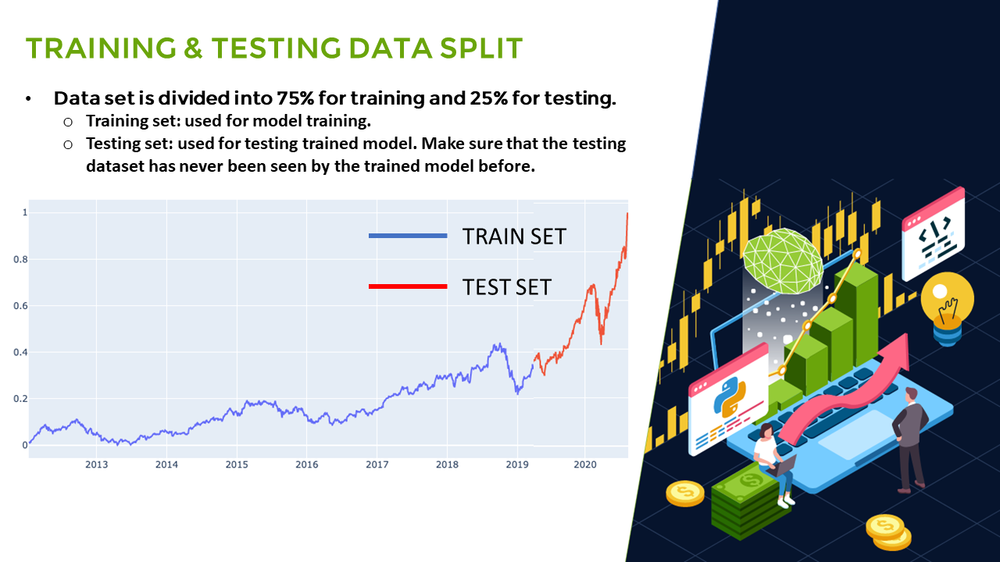

In [29]:
from IPython.display import Image
Image('/home/adish/Downloads/sp2.PNG')

In [36]:
# Function to concatenate the date, stock price, and volume in one dataframe
def individual_stock(price_df, vol_df, name):
    return pd.DataFrame({'Date': price_df['Date'], 'Close': price_df[name], 'Volume': vol_df[name]})

In [37]:
# Function to return the input/output (target) data for AI/ML Model
# Note that our goal is to predict the future stock price 
# Target stock price today will be tomorrow's price 
def trading_window(data): 
  
  # 1 day window 
  n = 1

  # Create a column containing the prices for the next 1 days
  data['Target'] = data[['Close']].shift(-n)
  
  # return the new dataset 
  return data

In [39]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(df_stock_price, df_stock_volume, 'AAPL')
price_volume_df

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [41]:
price_volume_target_df=trading_window(price_volume_df)
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004
2157,2020-08-10,450.910004,53100900,437.500000


In [42]:
#remove the last row as it will be a null value
price_volume_target_df=price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2153,2020-08-04,438.660004,43267900,440.250000
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004


In [44]:
#scaling the data
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler(feature_range=(0,1))
price_volume_target_scaled_df=sc.fit_transform(price_volume_target_df.drop(columns=['Date']))
price_volume_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [45]:
#creating feature and the target
x=price_volume_target_scaled_df[:,:2]
y=price_volume_target_scaled_df[:,2:]
x

array([[0.01102638, 0.11442624],
       [0.01046185, 0.12362365],
       [0.01220906, 0.13517696],
       ...,
       [1.        , 0.10747163],
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054]])

In [46]:
y

array([[0.01046185],
       [0.01220906],
       [0.01378478],
       ...,
       [0.97208751],
       [0.98824476],
       [0.95470465]])

In [47]:
x.shape

(2158, 2)

In [48]:
split=int(0.65*len(x))#65% into training 
split

1402

In [49]:
xtrain=x[:split]
xtrain.shape

(1402, 2)

In [50]:
ytrain=y[:split]
ytrain.shape

(1402, 1)

In [51]:
xtest=x[split:]
ytest=y[split:]
xtest

array([[0.26329349, 0.04044577],
       [0.24893705, 0.08062673],
       [0.25433945, 0.04078972],
       ...,
       [1.        , 0.10747163],
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054]])

In [52]:
ytest

array([[0.24893705],
       [0.25433945],
       [0.26026714],
       [0.26464411],
       [0.26301836],
       [0.25528989],
       [0.25438948],
       [0.25366417],
       [0.26009205],
       [0.26059226],
       [0.25881649],
       [0.26029214],
       [0.26431895],
       [0.26792058],
       [0.26902108],
       [0.2706468 ],
       [0.27077186],
       [0.26584464],
       [0.26541946],
       [0.2637937 ],
       [0.25721577],
       [0.26439399],
       [0.26279327],
       [0.25976689],
       [0.25634036],
       [0.26034217],
       [0.25731579],
       [0.25746586],
       [0.25081289],
       [0.24410985],
       [0.24035817],
       [0.23700667],
       [0.24348457],
       [0.24621079],
       [0.24383473],
       [0.24593567],
       [0.24516032],
       [0.24683607],
       [0.24433495],
       [0.24911211],
       [0.24888701],
       [0.2502376 ],
       [0.25038767],
       [0.25201342],
       [0.25063779],
       [0.25311392],
       [0.26034217],
       [0.261

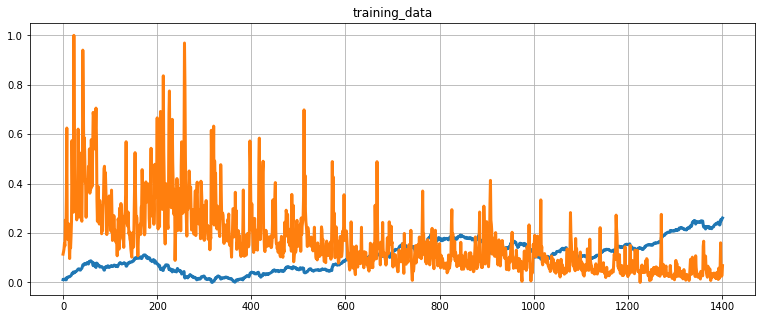

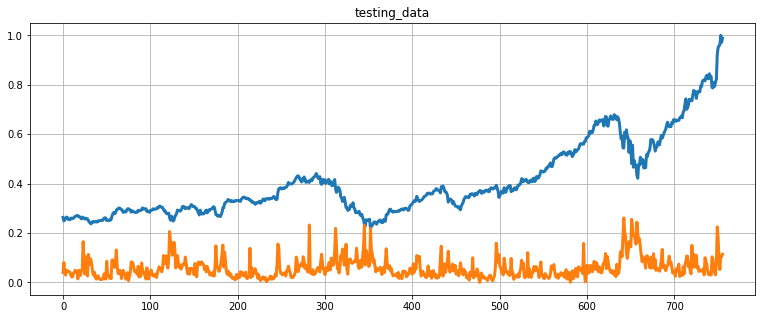

In [55]:
#plotting function
def show_plot(df,title):
    plt.figure(figsize=(13,5))
    plt.plot(df,linewidth=3)
    plt.title(title)
    plt.grid()
show_plot(xtrain,'training_data')
show_plot(xtest,'testing_data')

# Regularization and Ridge regression

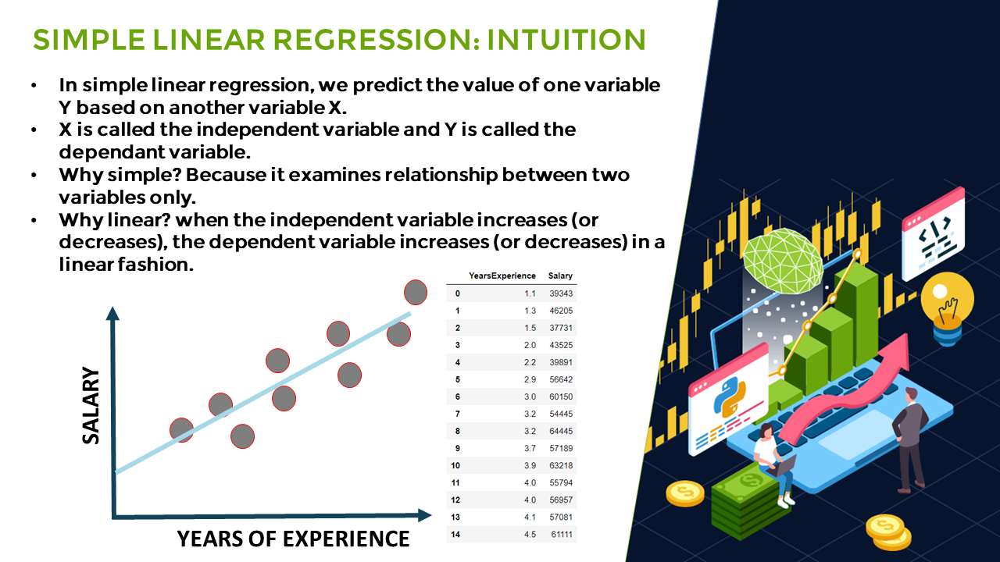

In [56]:
from IPython.display import Image
Image('/home/adish/Downloads/sp3.PNG')

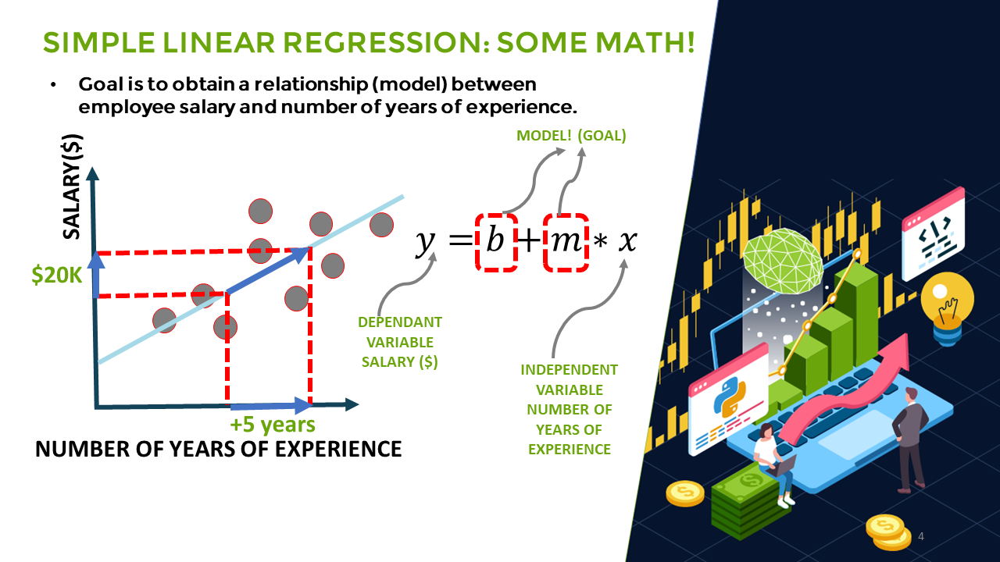

In [57]:
from IPython.display import Image
Image('/home/adish/Downloads/sp4.PNG')

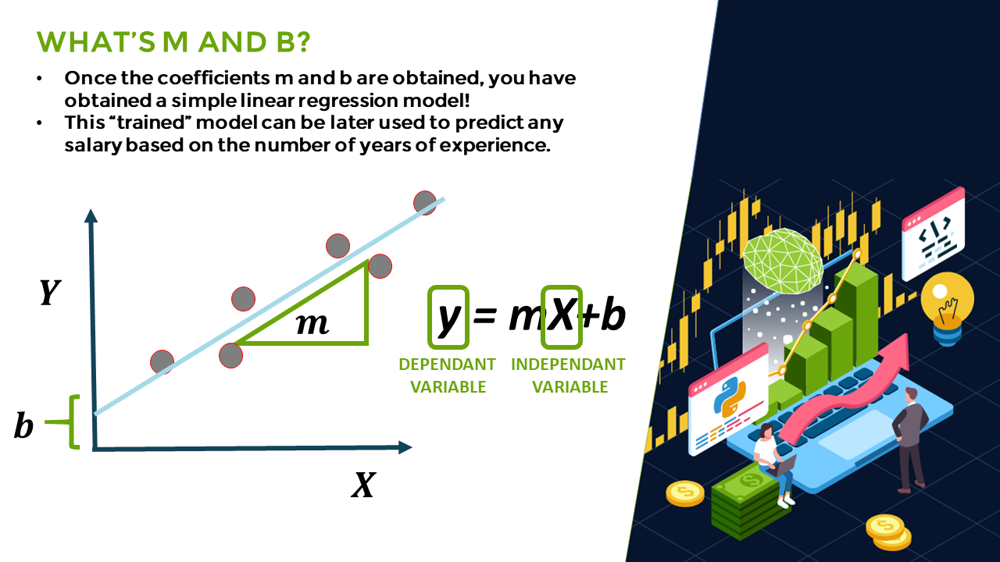

In [58]:
from IPython.display import Image
Image('/home/adish/Downloads/sp5.PNG')

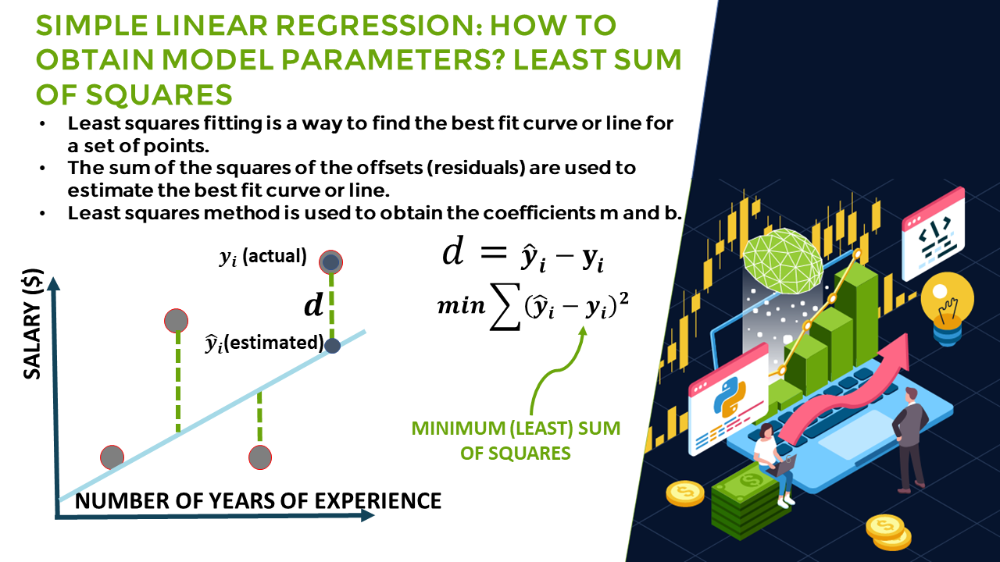

In [59]:
from IPython.display import Image
Image('/home/adish/Downloads/sp6.PNG')

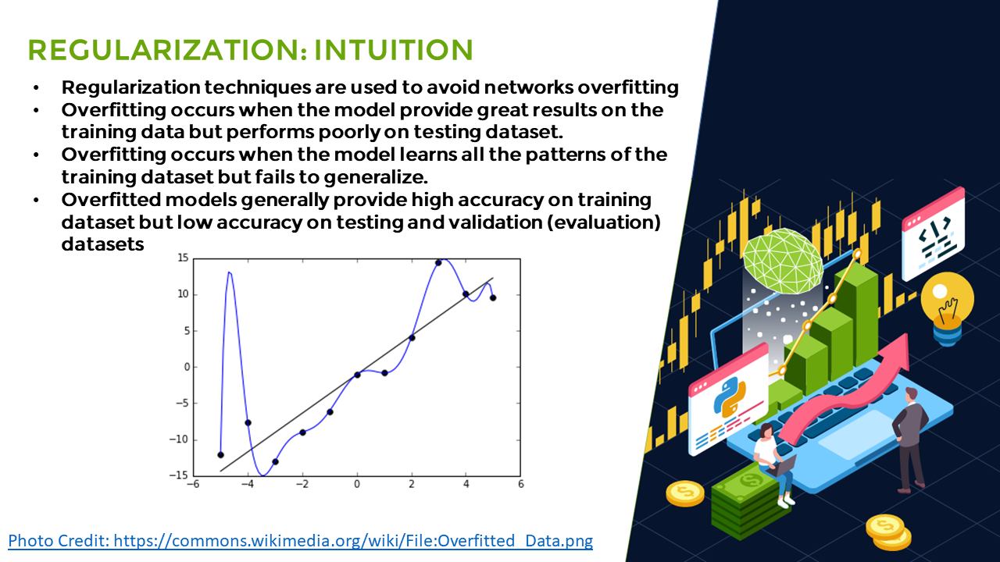

In [60]:
from IPython.display import Image
Image('/home/adish/Downloads/sp7.PNG')

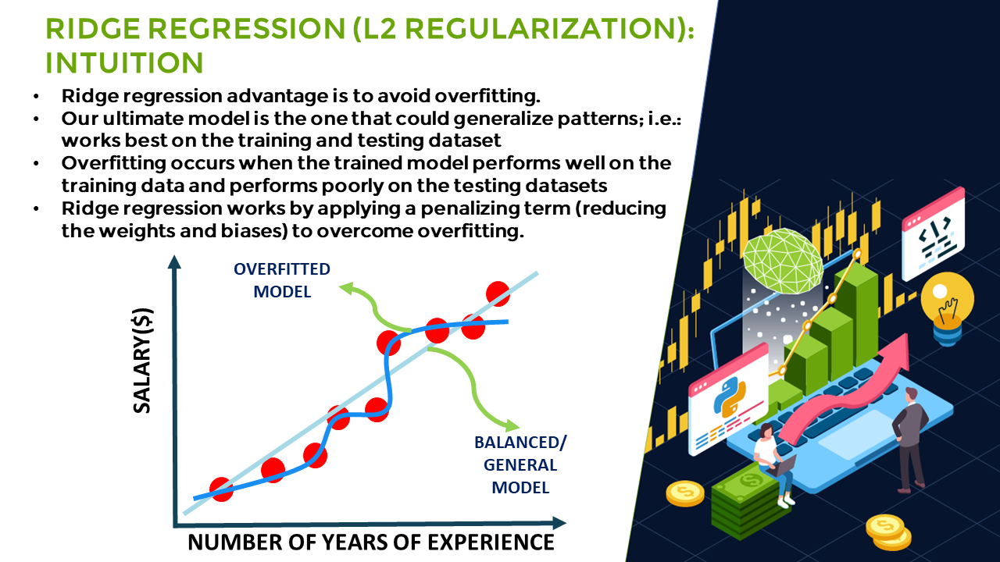

In [61]:
from IPython.display import Image
Image('/home/adish/Downloads/sp8.PNG')

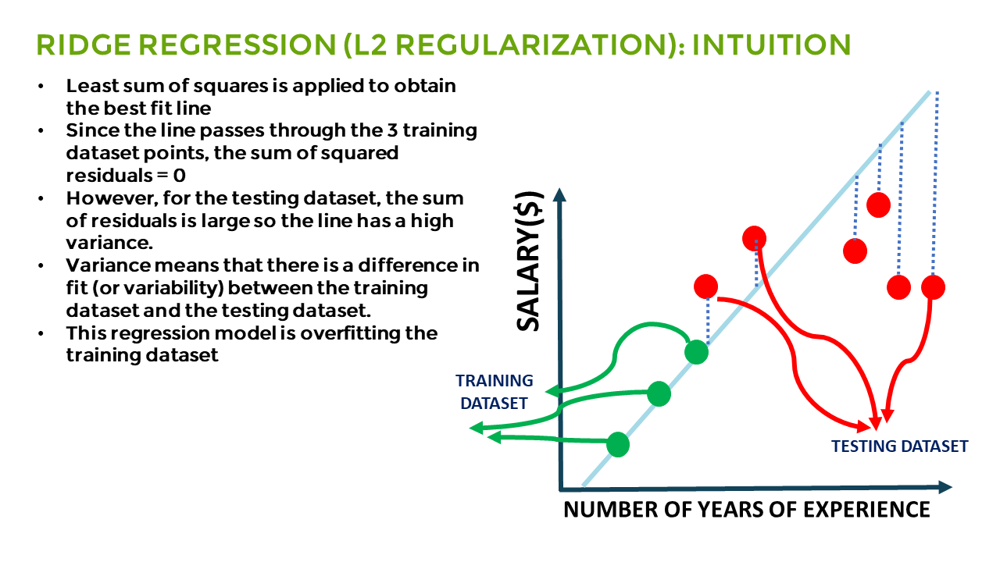

In [62]:
from IPython.display import Image
Image('/home/adish/Downloads/sp9.PNG')

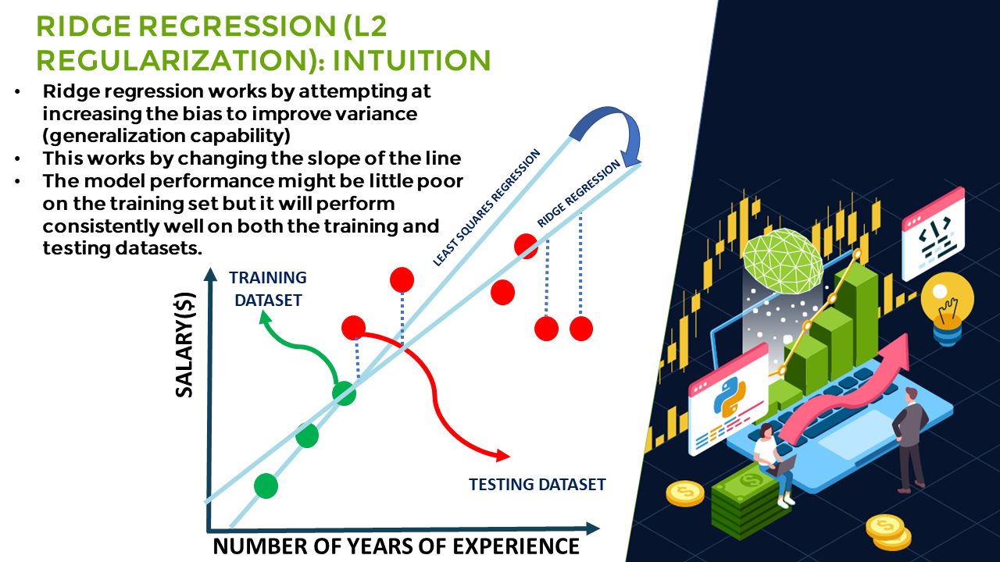

In [63]:
from IPython.display import Image
Image('/home/adish/Downloads/sp10.PNG')

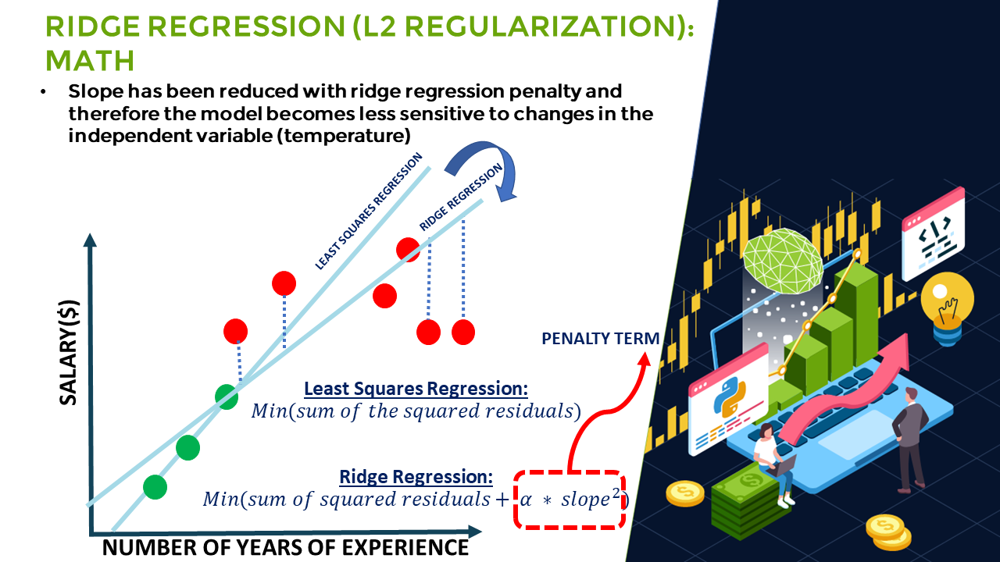

In [64]:
from IPython.display import Image
Image('/home/adish/Downloads/sp11.PNG')

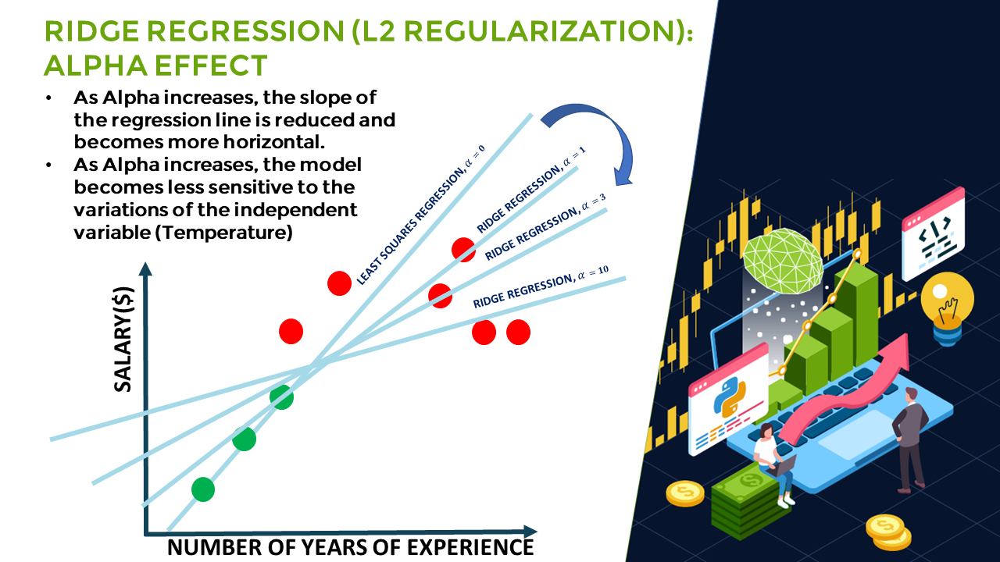

In [65]:
from IPython.display import Image
Image('/home/adish/Downloads/sp12.PNG')

## Inability for a ml method to capture the true relationship is called bias


# Building and training  a ridge linear regression model

In [66]:
from sklearn.linear_model import Ridge
#ridge regression performs linear least squares with L2 regularization
reg=Ridge()
reg.fit(xtrain,ytrain)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [67]:
reg.score(xtest,ytest)


0.7950028030821767

In [68]:
predicted_prices=reg.predict(x)
predicted_prices

array([[0.03466412],
       [0.03374627],
       [0.03451936],
       ...,
       [0.81048342],
       [0.78876033],
       [0.80091324]])

In [71]:
#appending predicted values into a list
predicted=[]
for i in predicted_prices:
    predicted.append(i[0])
predicted

[0.03466412066813623,
 0.033746272122637866,
 0.034519358374986236,
 0.034556003426505555,
 0.034707417256940834,
 0.0272353909726644,
 0.03304435664695353,
 0.02253833228247727,
 0.015366432147886962,
 0.03723482148664508,
 0.038835937932053866,
 0.03762457555962902,
 0.03816017127371425,
 0.04238142210970154,
 0.04502630930569739,
 0.042773672451817804,
 0.045290920065069885,
 0.044289332606441106,
 0.043246247234314326,
 0.031017852394209025,
 0.04003378113028107,
 0.04664107856772606,
 0.05057271537215566,
 0.01028089840085819,
 0.03141631904427818,
 0.045849070023290646,
 0.04694698644395233,
 0.05076555542093848,
 0.048707247219661465,
 0.05580409384083506,
 0.05205558407530819,
 0.052891366709914914,
 0.04242347557843818,
 0.05249795814347361,
 0.06159483809503503,
 0.044877667375755576,
 0.044025763813733014,
 0.04456072355792488,
 0.05770356033391505,
 0.06204455542338161,
 0.06436967280869026,
 0.058849938533416545,
 0.03911784864371517,
 0.04715724547658748,
 0.0589822550442

In [72]:
price_volume_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [73]:
#append close prices into  a list
close=[]
for i in price_volume_target_scaled_df:
    close.append(i[0])
close

[0.011026384814221801,
 0.010461850751312146,
 0.012209064567417965,
 0.013784776200681387,
 0.013298840009958124,
 0.010636929543771906,
 0.013177355336995877,
 0.010676229730427894,
 0.020055450755057824,
 0.019330121828027513,
 0.02027698295340838,
 0.02232432934117673,
 0.023564167317859763,
 0.023460550686230847,
 0.02307824113163892,
 0.02470754438327427,
 0.026240369215761894,
 0.027976878214271583,
 0.030781713002119487,
 0.036673647108144525,
 0.03676296980693192,
 0.040043025963404616,
 0.0424941190533388,
 0.0382815032077036,
 0.039903670747983455,
 0.03987151627718541,
 0.04441999577489858,
 0.043773267221180245,
 0.0449702284015899,
 0.04712119642323834,
 0.048318177612652835,
 0.051766154340099235,
 0.054278004773268135,
 0.05500331369129366,
 0.05525701036494465,
 0.05096222754088253,
 0.04992603371221188,
 0.05007968286047457,
 0.054117199904645114,
 0.05525344375982963,
 0.05769381202316293,
 0.06344640842164612,
 0.07112129492756925,
 0.06968492850522459,
 0.069688497

In [74]:
#create a dataframe based on dates in the individual stock data
df_predicted=price_volume_target_df[['Date']]
df_predicted

,Date
0,2012-01-12
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
...,...
2153,2020-08-04
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07


In [75]:
#add closing price to the dataframe
df_predicted['close']=close
df_predicted

,Date,close
0,2012-01-12,0.011026
1,2012-01-13,0.010462
2,2012-01-17,0.012209
3,2012-01-18,0.013785
4,2012-01-19,0.013299
...,...,...
2153,2020-08-04,0.957606
2154,2020-08-05,0.961583
2155,2020-08-06,1.000000
2156,2020-08-07,0.972088


In [76]:
#adding predicted value to the dataframe
df_predicted['prediction']=predicted
df_predicted

,Date,close,prediction
0,2012-01-12,0.011026,0.034664
1,2012-01-13,0.010462,0.033746
2,2012-01-17,0.012209,0.034519
3,2012-01-18,0.013785,0.034556
4,2012-01-19,0.013299,0.034707
...,...,...,...
2153,2020-08-04,0.957606,0.778280
2154,2020-08-05,0.961583,0.783205
2155,2020-08-06,1.000000,0.810483
2156,2020-08-07,0.972088,0.788760


In [77]:
#plotting
interactive_plot(df_predicted,'actual vs predicted')